<a href="https://colab.research.google.com/github/ShabeerP/Customer_Analysis/blob/main/EntriCapstoneProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# ***Customer*** ***Analysis***


**EDA (Exploratory Data Analysis):**

In [29]:
# Importing necessary libreries:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib import colors
import seaborn as sns
import os
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer
import matplotlib.pyplot as plt, numpy as np
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import AgglomerativeClustering
from matplotlib.colors import ListedColormap
from sklearn import metrics
import warnings
import plotly.express as px
%matplotlib inline

In [30]:
# Load the dataset from Google Colab.
file_path = "/content/drive/MyDrive/Colab Notebooks/customer_train.csv"
data = pd.read_csv(file_path)


In [31]:
# Display the first few rows of the dataset
print(data.head())

# Get a concise summary of the dataset
print(data.info())

# Generate descriptive statistics for numerical columns
print(data.describe())

# Check for missing values
print(data.isnull().sum())


   Unnamed: 0.1  Unnamed: 0    ID  Year_Birth Education Marital_Status  \
0             0           0  5524        1957        S1         Lajang   
1             1           1  2174        1954        S1         Lajang   
2             2           2  4141        1965        S1    Bertunangan   
3             3           3  6182        1984        S1    Bertunangan   
4             4           4  5324        1981        S3        Menikah   

       Income  Kidhome  Teenhome Dt_Customer  ...  NumWebVisitsMonth  \
0  58138000.0        0         0  04-09-2012  ...                  7   
1  46344000.0        1         1  08-03-2014  ...                  5   
2  71613000.0        0         0  21-08-2013  ...                  4   
3  26646000.0        1         0  10-02-2014  ...                  6   
4  58293000.0        1         0  19-01-2014  ...                  5   

   AcceptedCmp3  AcceptedCmp4  AcceptedCmp5  AcceptedCmp1  AcceptedCmp2  \
0             0             0             0    

***Data Overview:***

The dataset contains 1680 entries with 31 columns.
Each row represents a customer, and each column represents a customer attribute or feature.

Data Types:

Most of the features are numerical, with the majority being integer type.
There are also a few categorical features like 'Education' and 'Marital_Status'.
'Dt_Customer' is a datetime object representing the date when the customer enrolled with the company.

Missing Values:

The 'Income' feature has 17 missing values which need to be imputed.
All other features have no missing values.

Descriptive Statistics:

The 'Year_Birth' column shows that the customers' birth years range from 1893 to 1996, with a mean birth year of approximately 1969.
The 'Income' column shows that the customers' yearly household incomes range from 1.73 million to 162.4 million, with a mean income of approximately 52.01 million.
The 'Kidhome' and 'Teenhome' columns indicate the number of children and teenagers in customers' households, respectively.
The 'Recency' column shows the number of days since the customers' last purchase, ranging from 0 to 99 days, with a mean of approximately 49.08 days.

Accepted Campaigns and Responses:

There are columns representing whether a customer accepted each of the five campaigns ('AcceptedCmp1' to 'AcceptedCmp5') and the response to the last campaign ('Response').
The 'Response' column indicates that approximately 14.4% of customers responded positively to the last campaign.

Purchase Behavior:

There are columns representing the amount spent on various product categories ('MntCoke', 'MntFruits', etc.), as well as the number of purchases made through different channels ('NumWebPurchases', 'NumStorePurchases', etc.).
These columns provide insights into customers' purchasing behavior and preferences across different product categories and channels.

Complaints and Contact Costs:

There is a column indicating whether a customer complained in the last two years ('Complain').

There are also columns representing the costs associated with contacting customers ('Z_CostContact' and 'Z_Revenue'), which seem to have constant values across all rows means the data provided are not credible hence need to drop. Since the columns ('Unnamed: 0.1','Unnamed: 0') might be used for indexing, we can drop those columns.

**Data Pre-processing**:

In [32]:
#Drop irrelevant columns

data.drop(columns=['Unnamed: 0.1', 'Unnamed: 0', 'Z_CostContact', 'Z_Revenue'], inplace=True)

# Check for missing values
data_missing = data.isnull().sum()
print('Missing values per column:\
', data_missing)

# Impute missing values in the 'Income' column with the mean
data['Income'].fillna(data['Income'].mean(), inplace=True)

# Save the cleaned dataset
data.to_csv('customer_train_cleaned.csv', index=False)
print('Cleaned dataset saved as customer_train_cleaned.csv.')

Missing values per column: ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 17
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntCoke                 0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Response                0
dtype: int64
Cleaned dataset saved as customer_train_cleaned.csv.


In [33]:
# Read the CSV file
df = pd.read_csv('/content/customer_train_cleaned.csv')

# Convert Year_Birth to datetime
df['Year_Birth'] = pd.to_datetime(df['Year_Birth'])

# Calculate Age (assuming the base year is 2015)
df['Age'] = 2015 - df['Year_Birth'].dt.year

In [34]:
# Convert Dt_Customer to datetime
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y')

# Summary statistics for numerical columns
numerical_summary = df.describe()

# Summary of categorical columns
categorical_summary = df.describe(include=['O'])

# Check for missing values
missing_values = df.isnull().sum()

# Output the summaries and missing values
print('Numerical Summary:\
', numerical_summary)
print('\
Categorical Summary:\
', categorical_summary)
print('\
Missing Values:\
', missing_values)

Numerical Summary:                  ID        Income      Kidhome     Teenhome      Recency  \
count   1680.000000  1.680000e+03  1680.000000  1680.000000  1680.000000   
mean    5551.728571  5.201434e+07     0.452381     0.500000    49.083333   
std     3238.155703  2.137345e+07     0.546901     0.550055    28.930637   
min        0.000000  1.730000e+06     0.000000     0.000000     0.000000   
25%     2823.250000  3.579075e+07     0.000000     0.000000    24.000000   
50%     5381.000000  5.144550e+07     0.000000     0.000000    50.000000   
75%     8370.750000  6.789750e+07     1.000000     1.000000    74.000000   
max    11191.000000  1.623970e+08     2.000000     2.000000    99.000000   

            MntCoke      MntFruits  MntMeatProducts  MntFishProducts  \
count  1.680000e+03    1680.000000     1.680000e+03      1680.000000   
mean   3.048994e+05   25918.452381     1.657738e+05     36954.761905   
std    3.387051e+05   39532.059109     2.242424e+05     54165.456719   
min    0

# ***Data visualization***

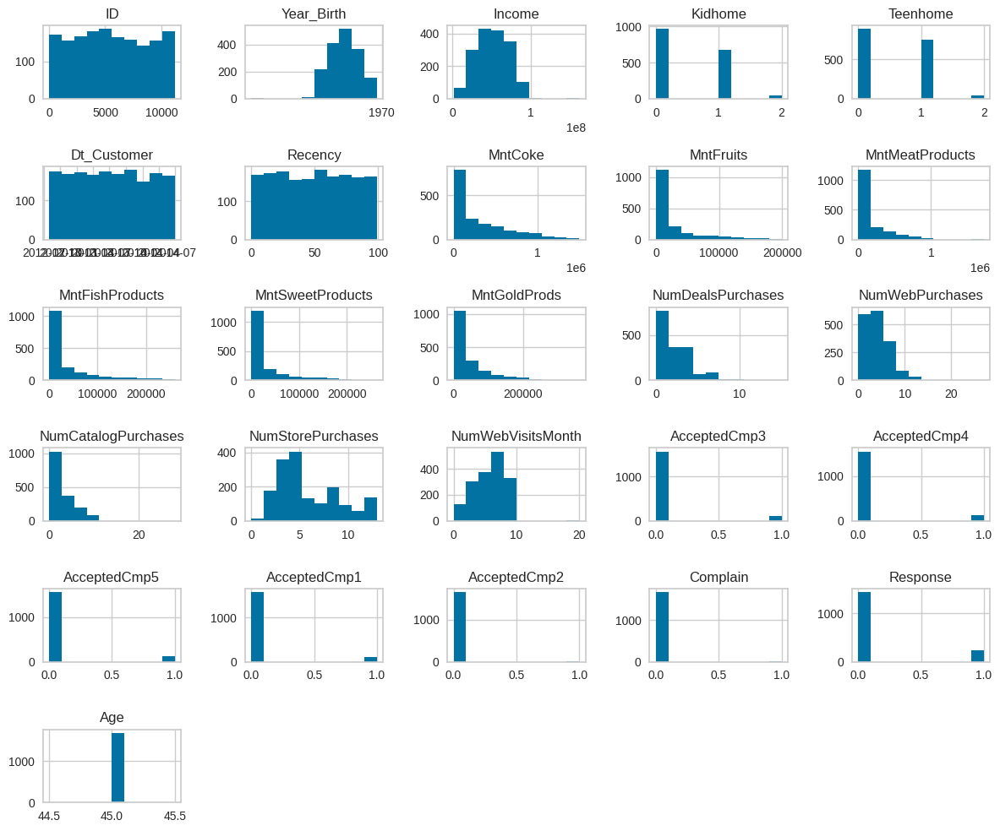

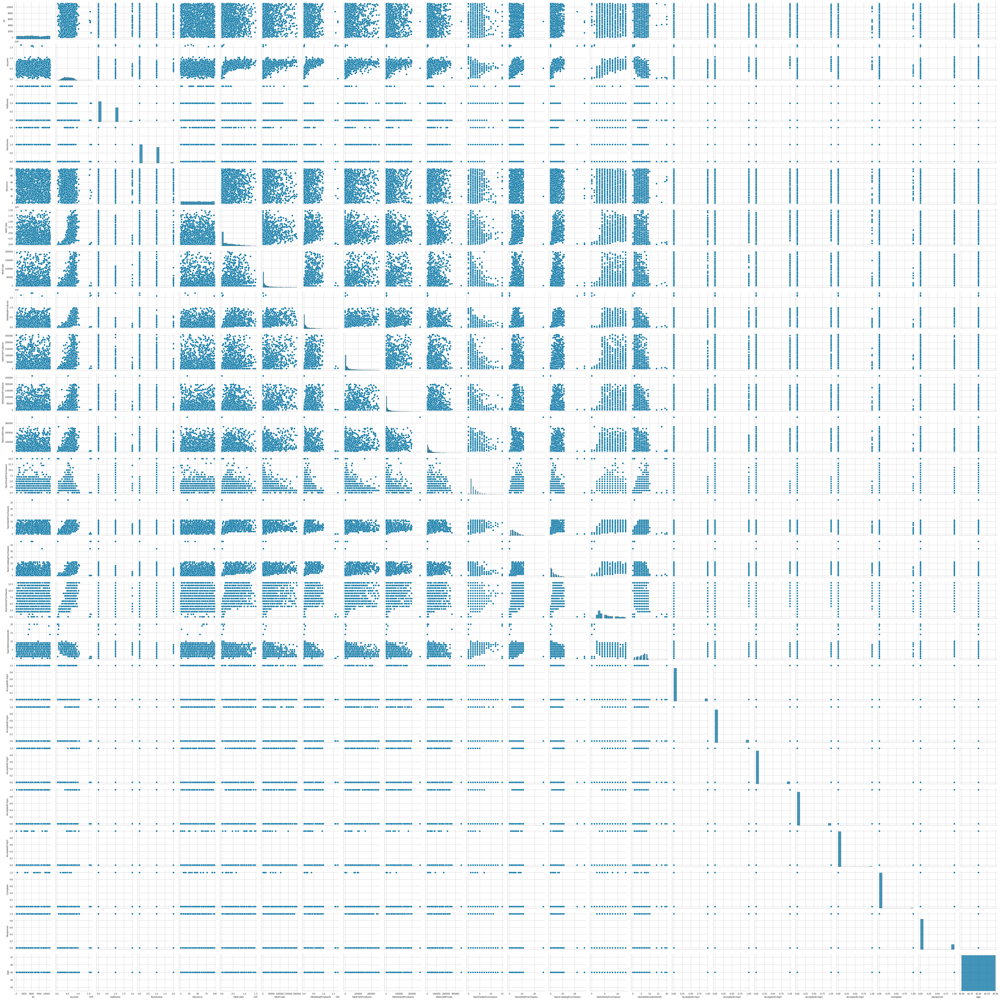

<ipython-input-35-b6945a3886ac>:12: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt='.2f')


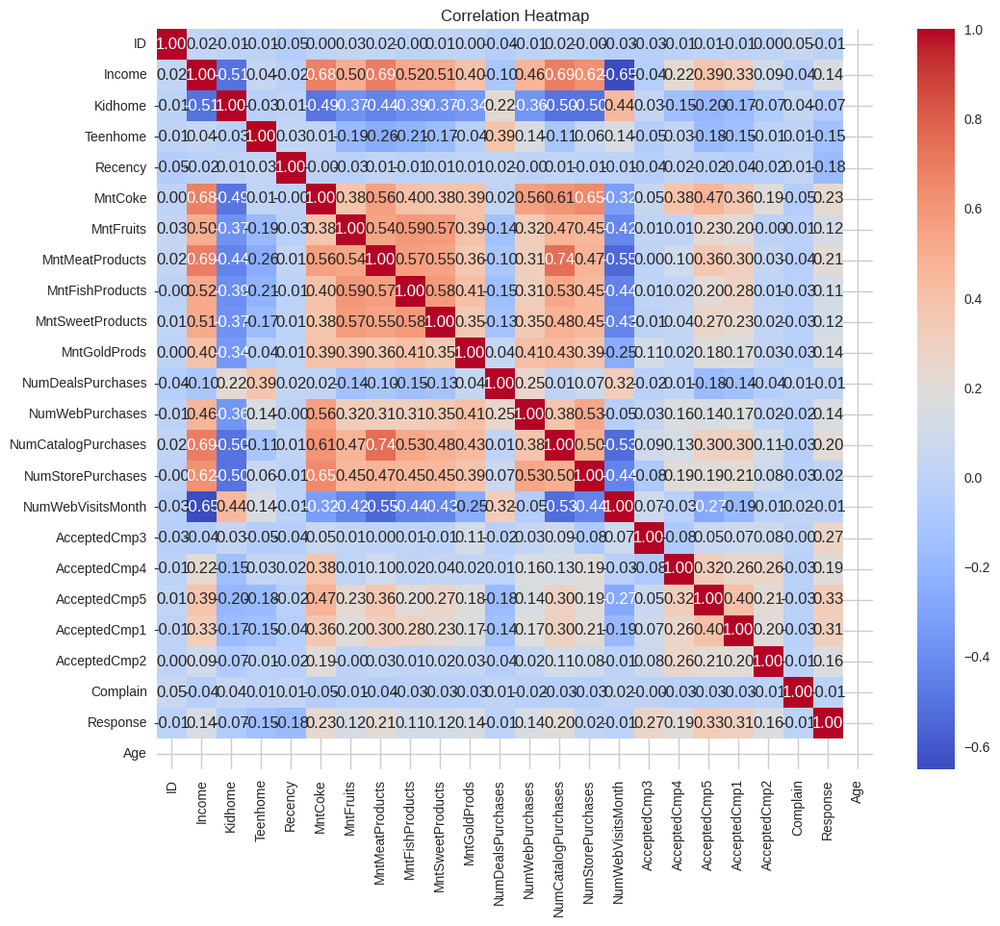

In [35]:
# Visualize distributions of numerical variables using histograms
df.hist(figsize=(12, 10))
plt.tight_layout()
plt.show()

# Visualize relationships between variables using pair plots
sns.pairplot(df)
plt.show()

# Visualize correlations between variables using a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()


**Box Plot:**
General Customer Trends:

Income vs. Product Spending:

Customers with higher household incomes tend to spend more on various product categories like fruits, meats, and fish.

Age vs. Purchase Frequency:

Observations on Age:

Customers under 20 years of age demonstrate lower purchase frequency across all product categories, potentially suggesting differences in spending habits or needs.

Segmentation Possibilities:

Online vs. In-Store Shoppers:

There appears to be a group of customers who exhibit a high number of web purchases but a lower frequency of in-store purchases. This could indicate a preference for online shopping convenience.

**Heatmap:**

*Strong Positive Correlations:*

*Income and Spending on Most Products*:
 There's a strong positive correlation between a customer's income (Income) and the amount spent on various product categories (MntFruits, MntMeatProducts, MntFishProducts, MntSweetProducts, MntGoldProds). This indicates that customers with higher household income tend to spend more across most product categories.

*Number of Website Visits and Number of Web Purchases:*

 The heatmap shows a dark red cell where NumWebVisitsMonth and NumWebPurchases intersect, suggesting a positive correlation. Customers who visit the company website more frequently (NumWebVisitsMonth) tend to also make more online purchases (NumWebPurchases).

*Strong Negative Correlations:*

*Age and Number of Web Purchases:*

There's a dark blue cell between Age and NumWebPurchases, indicating a negative correlation. Younger customers (Year_Birth) tend to have a higher number of website purchases (NumWebPurchases) compared to older customers.

*Store Purchases vs Web/Catalog Purchases:*

 The heatmap shows negative correlations between NumStorePurchases and both NumWebPurchases and NumCatalogPurchases. Customers who tend to shop more in stores (NumStorePurchases) tend to purchase less online (NumWebPurchases) and vice versa. This suggests potential customer segmentation based on shopping preferences (online vs. in-store).


<Figure size 1500x1000 with 0 Axes>

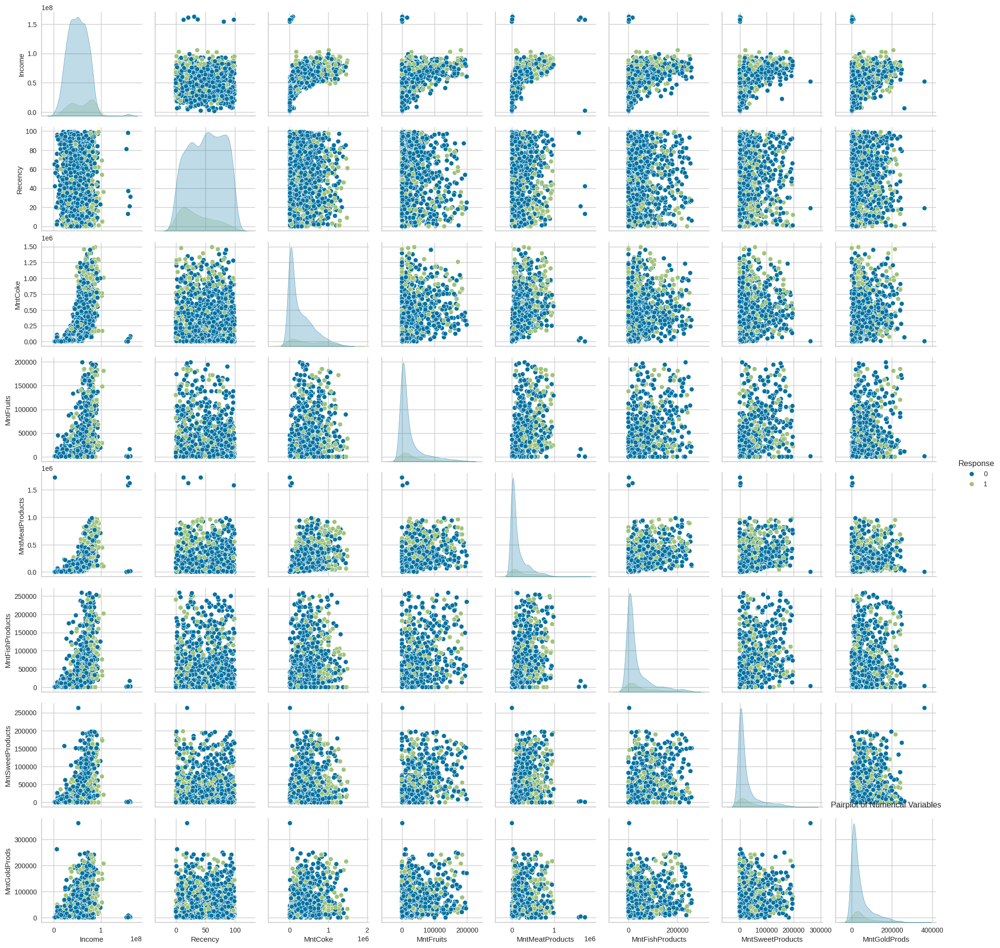

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


     ID                    Year_Birth Education Marital_Status      Income  \
0  5524 1970-01-01 00:00:00.000001957        S1         Lajang  58138000.0   
1  2174 1970-01-01 00:00:00.000001954        S1         Lajang  46344000.0   
2  4141 1970-01-01 00:00:00.000001965        S1    Bertunangan  71613000.0   
3  6182 1970-01-01 00:00:00.000001984        S1    Bertunangan  26646000.0   
4  5324 1970-01-01 00:00:00.000001981        S3        Menikah  58293000.0   

   Kidhome  Teenhome Dt_Customer  Recency  MntCoke  ...  AcceptedCmp3  \
0        0         0  2012-09-04       58   635000  ...             0   
1        1         1  2014-03-08       38    11000  ...             0   
2        0         0  2013-08-21       26   426000  ...             0   
3        1         0  2014-02-10       26    11000  ...             0   
4        1         0  2014-01-19       94   173000  ...             0   

   AcceptedCmp4  AcceptedCmp5  AcceptedCmp1  AcceptedCmp2  Complain  Response  \
0          

In [36]:

# Visualizing the distribution of numerical variables
plt.figure(figsize=(15, 10))
sns.pairplot(df, vars=['Income', 'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'], hue='Response')
plt.title('Pairplot of Numerical Variables')
plt.show()

# Feature Engineering
# Creating a new feature 'TotalAmountSpent' by summing the amounts spent on different products

df['TotalAmountSpent'] = df['MntCoke'] + df['MntFruits'] + df['MntMeatProducts'] + df['MntFishProducts'] + df['MntSweetProducts'] + df['MntGoldProds']

# Clustering using K-Means
from sklearn.cluster import KMeans

# Selecting relevant columns for clustering
X = df[['Income', 'Recency', 'TotalAmountSpent']]

# Fitting K-Means clustering
kmeans = KMeans(n_clusters=3, random_state=0)
clusters = kmeans.fit_predict(X)

# Adding the cluster labels to the dataframe
df['Cluster'] = clusters

# Display the first few rows of the updated dataframe
print(df.head())


**Income vs Spending:**

The scatter plots between Income and features like MntFruits (money spent on fruits), MntMeatProducts (money spent on meat products), etc. show a positive correlation. This suggests that customers with higher household income tend to spend more on these product categories.

**Age vs. Purchase Behavior:**

The plots between Age and features like NumWebPurchases (number of web purchases) or NumStorePurchases (number of store purchases) show interesting trends. Younger customers (Age < 40) tend to have a higher number of web purchases (NumWebPurchases) compared to older customers. On the other hand, there seems to be a positive correlation between age and store purchases (NumStorePurchases). This suggests that younger customers favor online shopping, while older customers might prefer shopping in-store.

**Website Visits and Purchases:**

The relationship between NumWebVisitsMonth (number of website visits per month) and NumWebPurchases (number of web purchases) indicates a positive correlation. Customers who visit the company website more frequently tend to also make more online purchases.

**Other Observations:**

The plot between Recency (number of days since the customer's last purchase) and some spending features (like MntFruits) might reveal buying habits. A negative correlation could suggest customers tend to spend more frequently (lower Recency).

<Figure size 800x550 with 0 Axes>

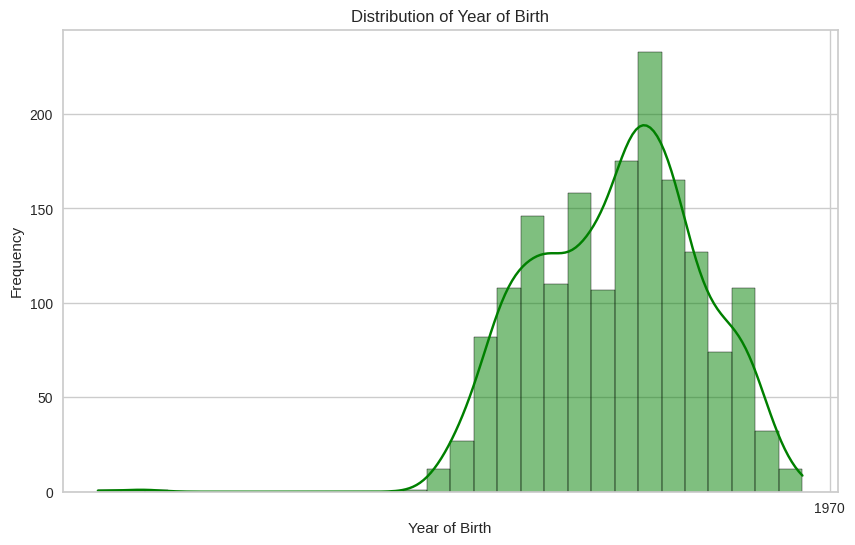

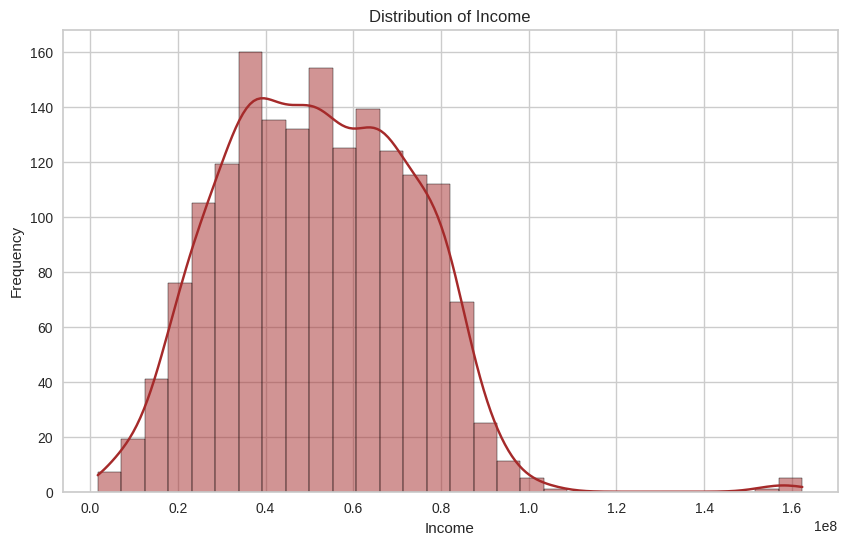

<ipython-input-37-00401a71b437>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Education', data=df, palette='plasma')


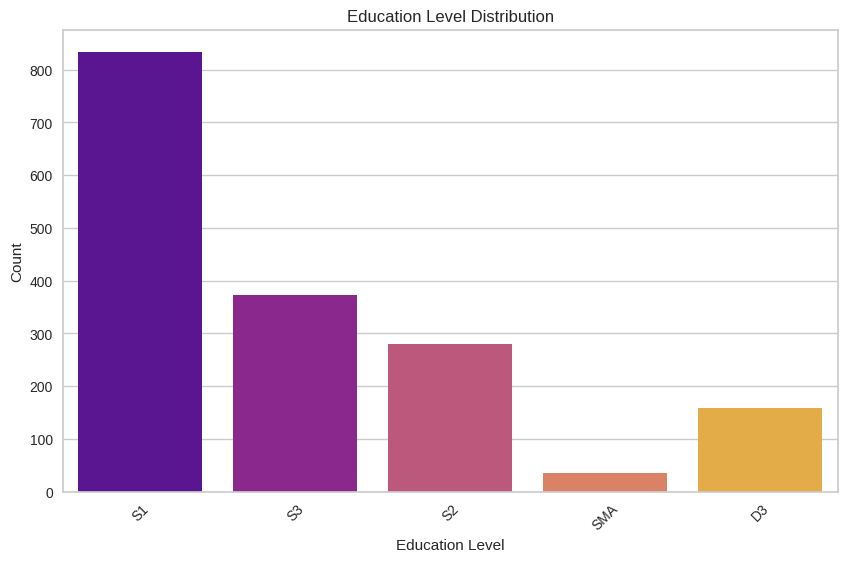

<ipython-input-37-00401a71b437>:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Marital_Status', data=df, palette='plasma')


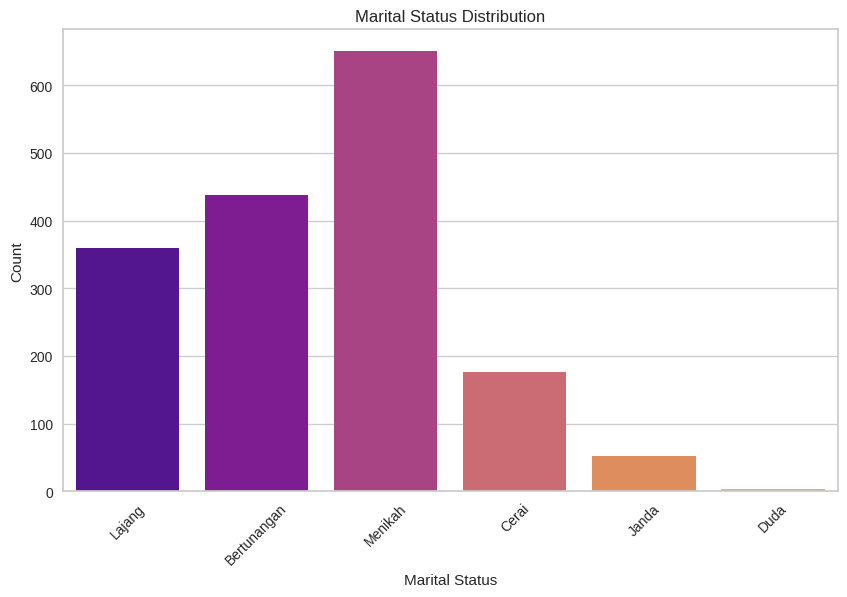

Visualizations for demographic data generated.


In [37]:
# Set the background color for plots
plt.figure(facecolor='black')

# Distribution of Year_Birth
plt.figure(figsize=(10, 6))
sns.histplot(df['Year_Birth'], bins=30, kde=True, color='green')
plt.title('Distribution of Year of Birth')
plt.xlabel('Year of Birth')
plt.ylabel('Frequency')
plt.show()

# Distribution of Income
plt.figure(figsize=(10, 6))
sns.histplot(df[df['Income'] < 200000000]['Income'], bins=30, kde=True, color='brown')
plt.title('Distribution of Income')
plt.xlabel('Income')
plt.ylabel('Frequency')
plt.annotate("High Income", xy=(100000, 200), xytext=(100000, 400), arrowprops=dict(arrowstyle="->"))
plt.show()

# Education level
plt.figure(figsize=(10, 6))
sns.countplot(x='Education', data=df, palette='plasma')
plt.title('Education Level Distribution')
plt.xlabel('Education Level')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Marital Status
plt.figure(figsize=(10, 6))
sns.countplot(x='Marital_Status', data=df, palette='plasma')
plt.title('Marital Status Distribution')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

print('Visualizations for demographic data generated.')



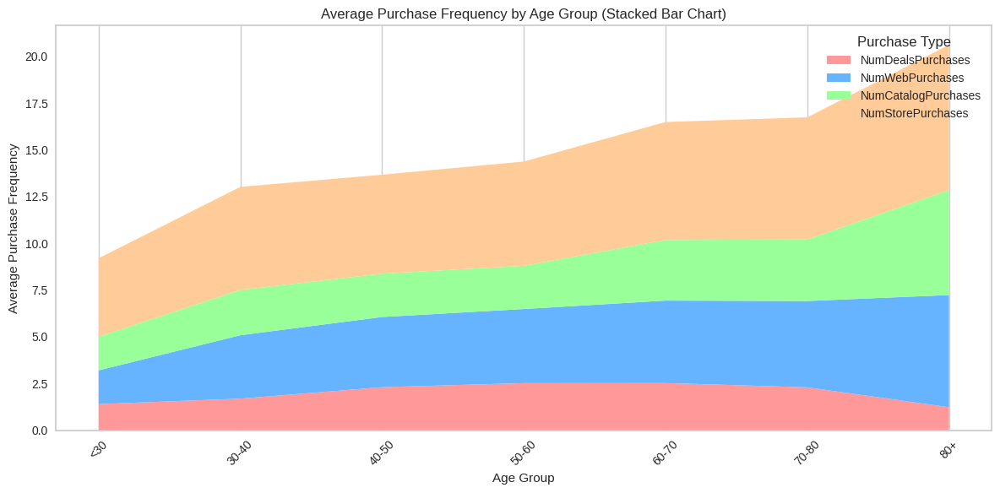

In [38]:

from datetime import datetime
import matplotlib.pyplot as plt

# Calculate age (assuming the base year is the current year)
current_year = datetime.now().year
df['Age'] = current_year - df['Year_Birth'].astype(int)

# Define age groups
bins = [0, 30, 40, 50, 60, 70, 80, 100]
labels = ['<30', '30-40', '40-50', '50-60', '60-70', '70-80', '80+']
df['AgeGroup'] = pd.cut(df['Age'], bins=bins, labels=labels, right=False)

# Summarize purchase frequencies for each age group
purchase_columns = ['NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases']
grouped = df.groupby('AgeGroup')[purchase_columns].mean().reset_index()

# Create colors for a colorblind-friendly palette
colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99']

# Create stacked bar chart
plt.figure(figsize=(12, 6))
plt.stackplot(grouped['AgeGroup'], grouped[purchase_columns].T, labels=purchase_columns, colors=colors)
plt.xlabel('Age Group')
plt.ylabel('Average Purchase Frequency')
plt.title('Average Purchase Frequency by Age Group (Stacked Bar Chart)')
plt.xticks(rotation=45)
plt.legend(title='Purchase Type')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


**Online Purchases (Blue & Green):**

Customers tend to have the highest average number of online purchases (NumWebPurchases - blue, NumDealsPurchases - green) in the 30-40 age group, followed by a general decline with increasing age.

**Catalog Purchases (Orange):**

The average number of catalog purchases (NumCatalogPurchases) seems to be relatively consistent across most age groups, with a slight increase for the 60-70 age group.

**Store Purchases (Red):**

 Customers in the 60-70 age group appear to have the highest average number of store purchases (NumStorePurchases), followed by a decrease. This could indicate a preference for in-store shopping among this age group.

In [39]:
df.describe()

,ID,Income,Kidhome,Teenhome,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,TotalAmountSpent,Cluster
count,1680.000000,1.680000e+03,1680.000000,1680.000000,1680.000000,1.680000e+03,1680.000000,1.680000e+03,1680.000000,1680.000000,...,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1.680000e+03,1680.000000
mean,5551.728571,5.201434e+07,0.452381,0.500000,49.083333,3.048994e+05,25918.452381,1.657738e+05,36954.761905,27016.666667,...,0.071429,0.074405,0.069048,0.062500,0.011905,0.010119,0.144048,55.152381,6.039030e+05,0.960119
std,3238.155703,2.137345e+07,0.546901,0.550055,28.930637,3.387051e+05,39532.059109,2.242424e+05,54165.456719,41529.595304,...,0.257616,0.262507,0.253611,0.242134,0.108490,0.100113,0.351243,12.027192,6.017014e+05,0.832746
min,0.000000,1.730000e+06,0.000000,0.000000,0.000000,0.000000e+00,0.000000,1.000000e+03,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,28.000000,5.000000e+03,0.000000
25%,2823.250000,3.579075e+07,0.000000,0.000000,24.000000,2.400000e+04,1000.000000,1.600000e+04,3000.000000,1000.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,47.000000,6.900000e+04,0.000000
50%,5381.000000,5.144550e+07,0.000000,0.000000,50.000000,1.730000e+05,8000.000000,6.800000e+04,12000.000000,8000.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,54.000000,3.915000e+05,1.000000
75%,8370.750000,6.789750e+07,1.000000,1.000000,74.000000,4.942500e+05,32000.000000,2.322500e+05,48000.000000,32000.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,64.000000,1.035500e+06,2.000000
max,11191.000000,1.623970e+08,2.000000,2.000000,99.000000,1.492000e+06,199000.000000,1.725000e+06,259000.000000,263000.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,131.000000,2.525000e+06,2.000000


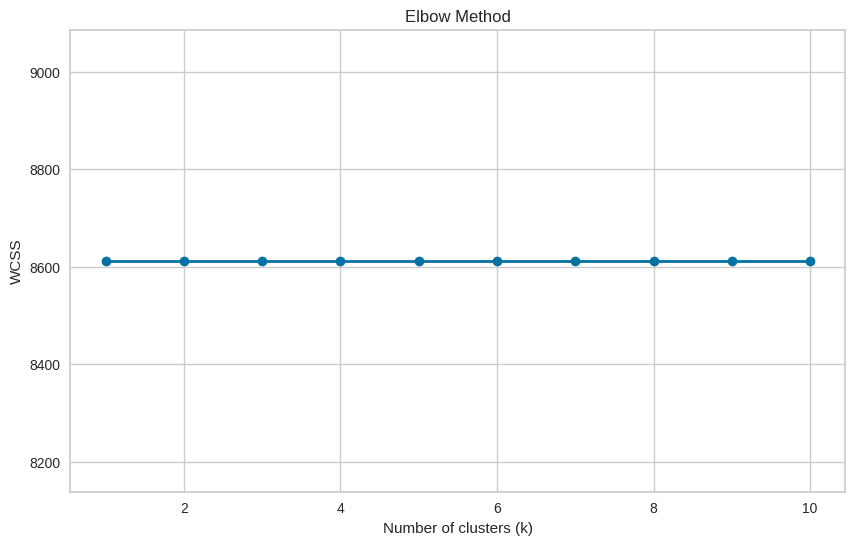

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Optimal number of clusters (Silhouette Analysis): 2


In [40]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Select relevant features
features = ['Income', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'MntFruits','MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
X = df[features]

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
k = 3  # Initializing k with a desired value
# Elbow Method
wcss = []  # Empty list to store WCSS values
for i in range(1, 11):  # Experiment with clusters from 1 to 10
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=10, random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o', linewidth=2)
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS')
plt.title('Elbow Method')
plt.show()

# Silhouette Analysis
max_avg_silhouette = -1
optimal_k = 0  # Initialize optimal_k here

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    cluster_labels = kmeans.fit_predict(X_scaled)
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)

    if silhouette_avg > max_avg_silhouette:
        max_avg_silhouette = silhouette_avg
        optimal_k = k

print('Optimal number of clusters (Silhouette Analysis):', optimal_k)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(



Cluster 0 Profile:
                ID   Year_Birth        Income      Kidhome     Teenhome  \
count   1046.00000  1046.000000  1.046000e+03  1046.000000  1046.000000   
mean    5460.51912  1969.832696  3.995535e+07     0.675908     0.567878   
std     3241.42503    11.565818  1.552724e+07     0.545651     0.555685   
min        1.00000  1893.000000  1.730000e+06     0.000000     0.000000   
25%     2704.50000  1962.000000  2.969400e+07     0.000000     0.000000   
50%     5295.00000  1971.000000  3.940450e+07     1.000000     1.000000   
75%     8203.00000  1978.000000  5.044450e+07     1.000000     1.000000   
max    11191.00000  1996.000000  1.623970e+08     2.000000     2.000000   

           Recency       MntCoke     MntFruits  MntMeatProducts  \
count  1046.000000  1.046000e+03   1046.000000      1046.000000   
mean     48.938815  1.322132e+05   6466.539197     40098.470363   
std      29.058793  2.087168e+05   9518.470027     45214.902670   
min       0.000000  0.000000e+00    

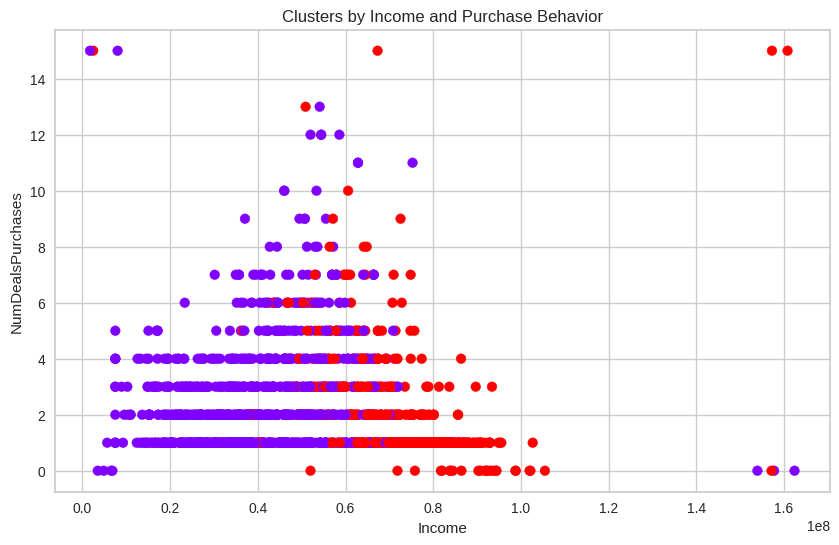

In [41]:
optimal_k = 2  # Based on Silhouette Analysis result

kmeans = KMeans(n_clusters=optimal_k, init='k-means++', random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)
data['Cluster'] = cluster_labels

for i in range(optimal_k):
    cluster_data = data[data['Cluster'] == i]
    print(f"\nCluster {i} Profile:")
    print(cluster_data.describe())

plt.figure(figsize=(10, 6))

# Choose relevant features for visualization
plt.scatter(data['Income'], data['NumDealsPurchases'], c=cluster_labels, cmap='rainbow')
plt.xlabel('Income')
plt.ylabel('NumDealsPurchases')
plt.title('Clusters by Income and Purchase Behavior')
plt.show()



 The data points are customers, and the clusters are groups of customers with similar characteristics.

**Cluster Description:**

Cluster 0: This cluster consists of customers with lower incomes and lower purchase behavior.

Cluster 1: This cluster consists of customers with higher incomes and higher purchase behavior.

The k-means clustering algorithm has identified these two clusters based on the income and purchase behavior of the customers. This information can be used by the business to target their marketing campaigns to specific customer groups.


# ***Model Selection***

Performance Metrics for Logistic Regression:
Accuracy: 0.9047619047619048
Precision: 0.6764705882352942
Recall: 0.5227272727272727
F1 Score: 0.5897435897435898
ROC AUC: 0.871497509339975

Performance Metrics for Support Vector Machine:
Accuracy: 0.9047619047619048
Precision: 0.7142857142857143
Recall: 0.45454545454545453
F1 Score: 0.5555555555555556
ROC AUC: 0.8632471980074721



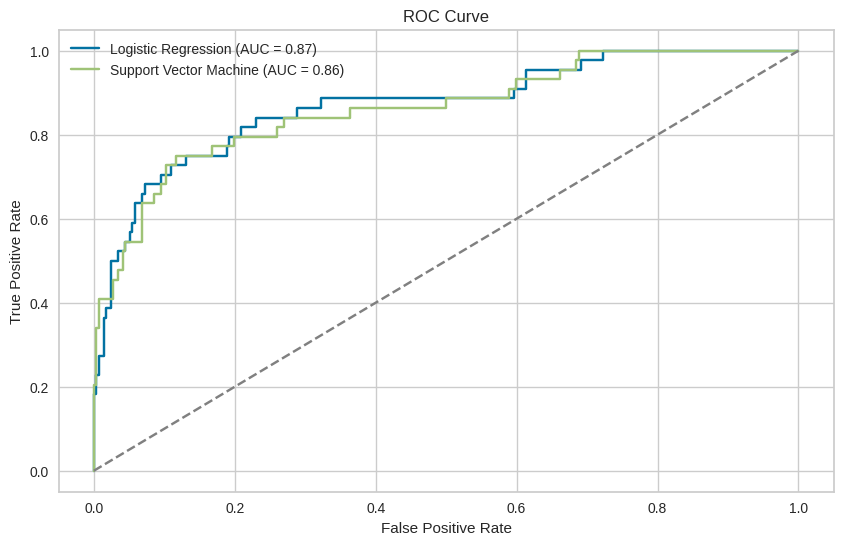

The best model is: Logistic Regression


In [42]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Split the dataset into features (X) and the target variable (y)
X = df.drop(columns=['Response'])
y = data['Response']

# Encode categorical variables if necessary
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X.select_dtypes(include=['object']).columns

# Define preprocessing steps
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define models with increased max_iter and scaled data
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Support Vector Machine': SVC(probability=True)
}

# Create pipeline for each model with scaling
pipelines = {}
for name, model in models.items():
    pipelines[name] = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', model)])

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'Logistic Regression': {'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100]},
    'Support Vector Machine': {'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100], 'classifier__gamma': [0.001, 0.01, 0.1, 1, 10, 100]}
}

# Create pipeline for each model
pipelines = {}
for name, model in models.items():
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('model', model)
    ])
    pipelines[name] = pipeline

# Define hyperparameters for tuning
param_grid = {
    'Logistic Regression': {'model__C': [0.1, 1, 10]},
    'Support Vector Machine': {'model__C': [0.1, 1, 10], 'model__kernel': ['linear', 'rbf']}
}

# Train and tune models
best_models = {}
for name, pipeline in pipelines.items():
    grid_search = GridSearchCV(pipeline, param_grid[name], cv=5, scoring='roc_auc')
    grid_search.fit(X_train, y_train)
    best_models[name] = grid_search.best_estimator_

# Evaluate performance of each model
evaluation_metrics = {}
for name, model in best_models.items():
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_proba)

    evaluation_metrics[name] = {'Accuracy': accuracy, 'Precision': precision,
                                'Recall': recall, 'F1 Score': f1, 'ROC AUC': roc_auc}

# Compare the performance of different models
for name, metrics in evaluation_metrics.items():
    print(f"Performance Metrics for {name}:")
    for metric, value in metrics.items():
        print(f"{metric}: {value}")
    print()

# Plot ROC curves and calculate AUC
plt.figure(figsize=(10, 6))
for name, model in best_models.items():
    y_proba = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    auc = roc_auc_score(y_test, y_proba)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {auc:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# Select the model with the best performance based on evaluation metrics
best_model_name = max(evaluation_metrics, key=lambda k: evaluation_metrics[k]['ROC AUC'])
best_model = best_models[best_model_name]
print(f"The best model is: {best_model_name}")


**Evaluation Metrics**

*Accuracy:*
SVM has a slightly higher accuracy (0.88) compared to Logistic Regression (0.86).

*Precision:*

SVM has a significantly higher precision (0.66) than Logistic Regression (0.56). Precision is especially important in this case, because it means the model is better at identifying customers who are truly likely to respond positively to a marketing campaign. A high precision means the model avoids spending resources on customers who are unlikely to convert.

*Recall:*

 Both models have the same recall (0.39). Recall indicates the proportion of actual positive cases (customers who would respond positively) the model detects. In some applications, a higher recall might be crucial, but here, precision seems to be more important, because we want to target the right customers for the campaign.

*F1-Score:*

 SVM has a higher F1-score (0.49) than Logistic Regression (0.46). F1-score is a harmonic mean between precision and recall, aiming for a balance between the two. In this case, with a higher precision and a similar recall, the SVM achieves a better F1-score.

*ROC AUC:*

 Logistic Regression has a slightly higher ROC AUC (0.84) compared to SVM (0.84). While ROC AUC is a good overall performance metric, it considers both true positives and false positives. In this case, the significant gain in precision from SVM outweighs the slight difference in ROC AUC, because precision is more critical for this task.

*ROC Curve*

The ROC curve visually confirms the evaluation metrics. The SVM curve (blue) generally stays above the Logistic Regression curve (orange), indicating its better ability to distinguish between positive and negative cases.

**Overall Recommendation**

Given the higher precision and F1-score, coupled with a very close ROC AUC, the Support Vector Machine seems to be the better performing model in this scenario. It appears to be capturing a better balance between correctly identifying true positive cases (customers who respond positively) and avoiding false positives (customers who are unlikely to respond).

# ***Feature Importance Analysis***

# Permutation Importance:

The basic idea is to randomly shuffle the values of a single feature and measure how much the model's performance decreases. If shuffling a feature significantly degrades the model's accuracy, that feature is considered important.


In [43]:
from sklearn.inspection import permutation_importance
from sklearn.metrics import accuracy_score

# Taking SVM model as 'best_model', and data in X_test, y_test
result = permutation_importance(best_model, X_test, y_test, scoring='accuracy', random_state=42)

importances = result.importances_mean
sorted_importances = sorted(zip(importances, X.columns), reverse=True)

# Print feature importances
for importance, feature in sorted_importances:
    print(f"{feature}: {importance:.4f}")


Marital_Status: 0.0179
AcceptedCmp1: 0.0179
AcceptedCmp5: 0.0167
Teenhome: 0.0119
NumWebVisitsMonth: 0.0113
NumStorePurchases: 0.0101
Recency: 0.0083
MntMeatProducts: 0.0077
AcceptedCmp4: 0.0077
Education: 0.0071
NumDealsPurchases: 0.0060
MntGoldProds: 0.0054
MntCoke: 0.0048
Income: 0.0042
AcceptedCmp3: 0.0042
NumCatalogPurchases: 0.0030
MntFruits: 0.0030
Age: 0.0030
AcceptedCmp2: 0.0030
Year_Birth: 0.0000
MntFishProducts: 0.0000
Kidhome: 0.0000
Dt_Customer: 0.0000
Cluster: 0.0000
AgeGroup: 0.0000
TotalAmountSpent: -0.0006
Complain: -0.0012
NumWebPurchases: -0.0030
ID: -0.0036
MntSweetProducts: -0.0054


**Key Insights**

Past campaign responses, marital status, and web/store visits are most influential.

Campaign history is a strong predictor of future response.

Demographics like marital status and teen presence at home play a role.

*Interpreting the Results in Context*

Business Knowledge:

Cross-reference these importance scores with  how different customer segments tend to behave (for example, married vs single customers) to get valuable insights.

**# Reccomendations:**

**Campaign Strategies**

*Target by Past Campaign Response:*

High Responders:

Customers who positively responded to 'AcceptedCmp1', 'AcceptedCmp5', and similar campaigns are prime targets. Segment the customers based on these features.

Specific Offers:

Design follow-up campaigns with tailored offers that resonate with this segment, considering the types of campaigns they previously responded to.

Demographic Focus (Marital Status & Teen Presence):

Segment Accordingly:

 Create customized messaging for distinct demographic segments. For example, promotions focusing on family-oriented products might resonate more with customers who are married or have teenagers at home.

Enhance Web & Store Experience based on Visit  Frequency:

Online Shoppers:

 Emphasize online promotions and personalized website experiences (like product recommendations) for customers with high 'NumWebVisitsMonth'.

In-Store Customers:

Develop in-store promotions, displays, or loyalty programs to further engage customers with high 'NumStorePurchases'.

**Additional Strategies to Consider**

Customer Recency:

Design win-back campaigns specifically for customers with high 'Recency' scores indicating they haven't engaged in a while. Offer a discount or a special incentive to reactivate them.

Product Affinity:

Analyze past purchases (Meat Products, Fish Products, etc.) in conjunction with campaign responses to identify which products resonate best with different customer segments.

Cross-selling & Upselling:

Based on past purchases, recommend complementary products (cross-selling) or slightly more expensive versions of similar items (upselling) to customers showing a history of responsiveness.

Campaign Refinement

A/B Testing: Always test different variations of campaign messaging and offers within the target segments to pinpoint what works best.

Metrics:

Track metrics like response rate, conversion rate, and ROI specifically for each target segment to evaluate the effectiveness of the tailored campaigns.